In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Imports

In [2]:
df_original = pd.read_csv(r'..\data\accidents-velos.csv', sep=',', low_memory=False)
df = df_original.copy() # Local copy of the original dataset

# Data exploration

In [3]:
print(df.shape)
print(df.dtypes)

(65981, 39)
identifiant accident            int64
date                           object
mois                           object
jour                           object
heure                         float64
departement                    object
commune                        object
lat                           float64
lon                           float64
en agglomeration               object
type intersection              object
type collision                 object
luminosite                     object
conditions atmosperiques       object
type route                     object
circulation                    object
nb voies                      float64
profil long route              object
trace plan route               object
largeur TPC                   float64
largeur route                 float64
etat surface                   object
amenagement                    object
situation                      object
categorie usager               object
gravite accident               object


In [4]:
df.head()

,identifiant accident,date,mois,jour,heure,departement,commune,lat,lon,en agglomeration,...,existence securite,usage securite,obstacle fixe heurte,obstacle mobile heurte,localisation choc,manoeuvre avant accident,identifiant vehicule,type autres vehicules,manoeuvre autres vehicules,nombre autres vehicules
0,200500000030,2005-01-13,01 - janvier,3 - jeudi,19.0,62,62331,50.300,2.840,oui,...,NaN,NaN,NaN,Véhicule,Côté gauche,Changeant de file à gauche,200500000030B02,Transport en commun,Dépassant à gauche,1.0
1,200500000034,2005-01-19,01 - janvier,2 - mercredi,10.0,62,62022,0.000,0.000,non,...,NaN,NaN,NaN,Véhicule,Avant,Sans changement de direction,200500000034B02,"VU seul 1,5T <= PTAC <= 3,5T avec ou sans remo...",Tournant à gauche,1.0
2,200500000078,2005-01-26,01 - janvier,2 - mercredi,13.0,02,02173,0.000,0.000,non,...,Casque,Non,NaN,Véhicule,Avant,Sans changement de direction,200500000078B02,VL seul,Tournant à gauche,1.0
3,200500000093,2005-01-03,01 - janvier,0 - lundi,13.0,02,02810,49.255,3.094,oui,...,NaN,NaN,NaN,Véhicule,Avant gauche,Manœuvre d’évitement,200500000093B02,VL seul,Manœuvre d’évitement,1.0
4,200500000170,2005-01-29,01 - janvier,5 - samedi,18.0,76,76196,0.000,0.000,non,...,Autre,Oui,NaN,Véhicule,Arrière,"Même sens, même file",200500000170A01,"VU seul 1,5T <= PTAC <= 3,5T avec ou sans remo...","Même sens, même file",1.0


# Dropping non pertinent rows
We decide to do so because the quantity of data that we have is enough.

In [5]:
print(f"Rows before dropping duplicates: {df.shape[0]}")
columns_na_drop = ['date', 'lat', 'lon', 'age', 'heure']
df = df.dropna(subset=columns_na_drop)
print(f"Rows after dropping duplicates: {df.shape[0]}")

Rows before dropping duplicates: 65981
Rows after dropping duplicates: 65223


# Extracting date components

In [6]:
df[['date', 'mois', 'jour', 'heure']]

,date,mois,jour,heure
0,2005-01-13,01 - janvier,3 - jeudi,19.0
1,2005-01-19,01 - janvier,2 - mercredi,10.0
2,2005-01-26,01 - janvier,2 - mercredi,13.0
3,2005-01-03,01 - janvier,0 - lundi,13.0
4,2005-01-29,01 - janvier,5 - samedi,18.0
...,...,...,...,...
65976,2018-09-27,09 - septembre,3 - jeudi,8.0
65977,2018-03-21,03 - mars,2 - mercredi,18.0
65978,2018-03-31,03 - mars,5 - samedi,17.0
65979,2018-03-31,03 - mars,5 - samedi,17.0


We are going to extract the year, the month name and value as well as the day name and value

In [7]:
df['annee'] = df['date'].str.split('-').str[0]
df['num_mois'] = df['date'].str.split('-').str[1]
df['num_jour'] = df['date'].str.split('-').str[2]

In [8]:
df["mois"] = df["mois"].str.split(" - ").str[1]
df["jour"] = df["jour"].str.split(" - ").str[1]

## Casting the columns

In [9]:
cols_to_cast_as_int = ['annee', 'num_mois', 'num_jour', 'heure']
for col in cols_to_cast_as_int:
    df[col] = df[col].astype(int)
df[['date', 'num_mois', 'mois', 'num_jour', 'jour', 'heure']].dtypes

date        object
num_mois     int32
mois        object
num_jour     int32
jour        object
heure        int32
dtype: object

# Handling the ages
We notice that the ages correspond to a range. Considering 'x' as an age, the variables have the following format => 'x - x+1'</br>
We are going to extract the value of x+1.</br>
We are going to need to pay attention to certain values however. In fact, some of them seem to be years. You will see how we handle them

In [10]:
# Plot the ages histogram
def plot_ages_hist(df, bins=20):
    fig, ax = plt.subplots(figsize=(10, 5))
    ax = sns.histplot(data=df, x="age", bins=bins, kde=True)
    ax.set_xlabel("Age")
    ax.set_ylabel("Number of accidents")
    ax.set_title("Number of accidents by age")

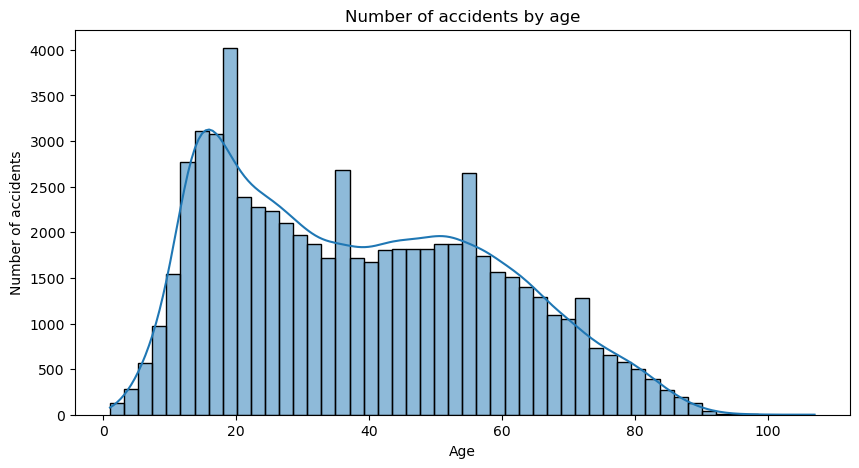

In [11]:
# If age length is less than 10 characters, it is a year (few cases, we can drop them)
df['age'] = df['age'].str.split('-').str[1]
df['age'] = df['age'].astype(int)
# Drop all ages above 110 yo
df = df[df['age'] < 110]
plot_ages_hist(df, 50)

# Checking for correct data types

In [12]:
df.dtypes

identifiant accident            int64
date                           object
mois                           object
jour                           object
heure                           int32
departement                    object
commune                        object
lat                           float64
lon                           float64
en agglomeration               object
type intersection              object
type collision                 object
luminosite                     object
conditions atmosperiques       object
type route                     object
circulation                    object
nb voies                      float64
profil long route              object
trace plan route               object
largeur TPC                   float64
largeur route                 float64
etat surface                   object
amenagement                    object
situation                      object
categorie usager               object
gravite accident               object
sexe        

In [13]:
df.to_csv(r'..\data\clean.csv', sep=',', index=False)

Everything seems fine.
# Graphing (uni variable)

## Usages

In [14]:
# Plot the usages histogram
def plot_usages_hist(df, bins=20):
    fig, ax = plt.subplots(figsize=(16, 5))
    ax = sns.histplot(data=df, x="motif deplacement", bins=bins)
    ax.set_xlabel("Usage")
    ax.set_ylabel("Number of accidents")
    ax.set_title("Number of accidents by usage")

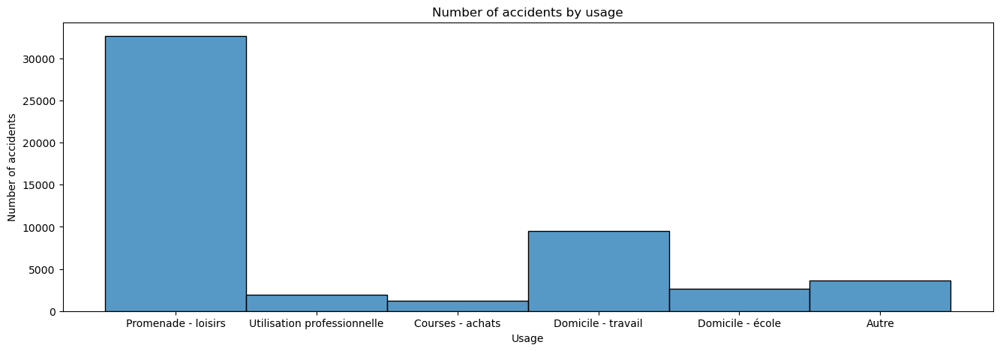

In [15]:
plot_usages_hist(df)

## Severity

In [16]:
# Plot the severities histogram
def plot_severities_hist(df, bins=20):
    fig, ax = plt.subplots(figsize=(16, 5))
    ax = sns.histplot(data=df, x="gravite accident", bins=bins)
    ax.set_xlabel("Severity")
    ax.set_ylabel("Number of accidents")
    ax.set_title("Number of accidents by severity")

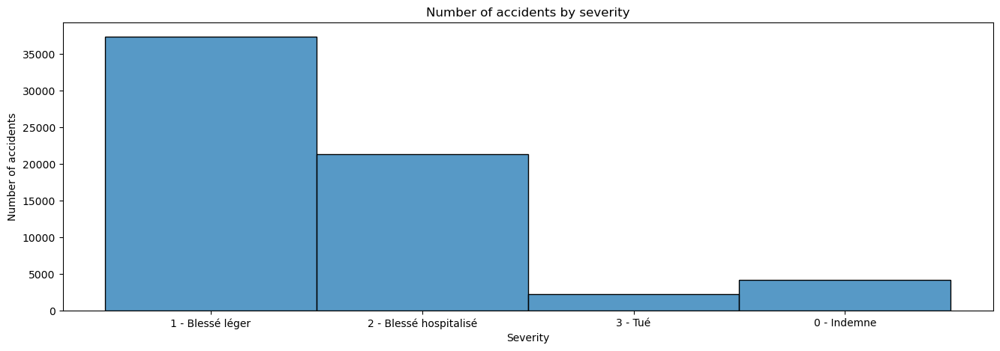

In [17]:
plot_severities_hist(df)

## Genders

If time, we will get data on the number of M/F users. This will allow us to compute ratios instead.

In [18]:
# Plot the sex histogram
def plot_gender_hist(df):
    fig, ax = plt.subplots(figsize=(16, 5))
    ax = sns.histplot(data=df, x="sexe")
    ax.set_xlabel

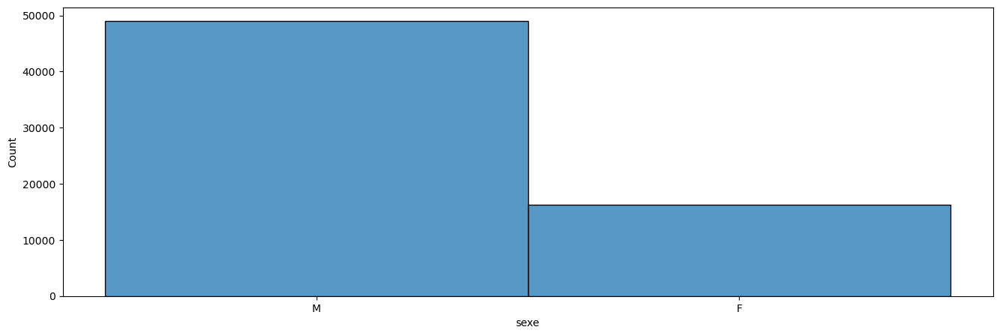

In [19]:
plot_gender_hist(df)

## City type

In [20]:
# Plot the type of agglomeration histogram
def plot_type_agglomeration_hist(df):
    fig, ax = plt.subplots(figsize=(16, 5))
    ax = sns.histplot(data=df, x="en agglomeration")
    ax.set_xlabel("In agglomeration")
    ax.set_ylabel("Number of accidents")
    ax.set_title("Number of accidents in agglomeration")

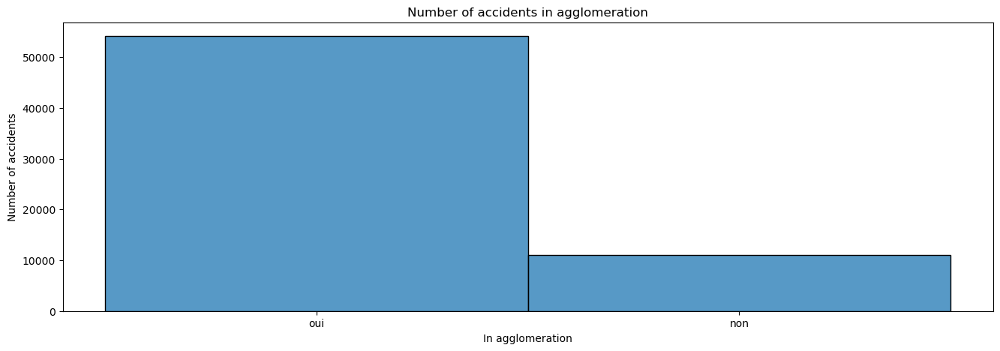

In [21]:
plot_type_agglomeration_hist(df)

## By condition

In [22]:
# Plot the conditinos histogram
def plot_conditions_hist(df):
    fig, ax = plt.subplots(figsize=(16, 5))
    ax = sns.histplot(data=df, x="conditions atmosperiques")
    ax.set_xlabel("Departement")
    ax.set_ylabel("Number of accidents")
    ax.set_title("Number of accidents by departement")

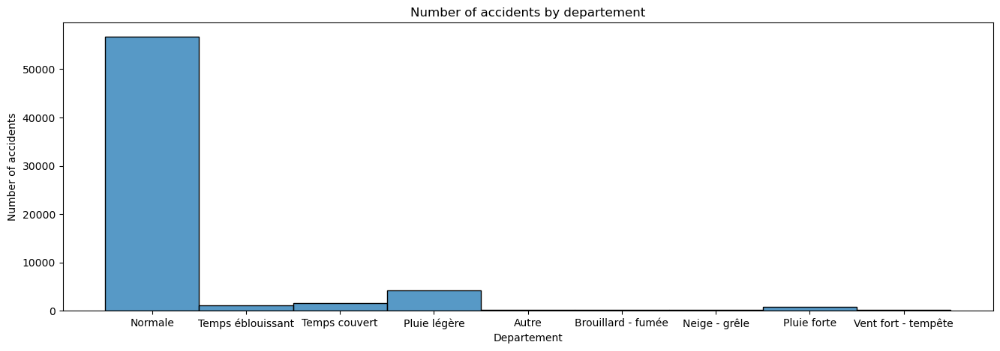

In [23]:
plot_conditions_hist(df)

## Map

In [24]:
# Plot the map of accidents
def plot_map(df):
    # Center on France
    center = {"lat": 46.2276, "lon": 2.2137}
    fig = px.scatter_mapbox(df, lat="lat", lon="lon", color="gravite accident", 
                            zoom=4, height=300, center=center,
                            hover_data=['date', 'heure', 'age', 'sexe', 'gravite accident', 'motif deplacement', 'conditions atmosperiques'])
    fig.update_layout(mapbox_style="open-street-map")
    fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
    fig.show()

In [25]:
plot_map(df)

# Interpretation
Since we have no data on the "hardware" damage. Therefore, we will focus our studies on the severity of the crashes.</br>
We invite you to check out the dashboard in oreder to get more detailed stats.